<a href="https://colab.research.google.com/github/gbardi/YOLO/blob/main/YOLOv9.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/Gautier242/YOLO.git

Cloning into 'YOLO'...
remote: Enumerating objects: 874, done.
remote: Counting objects: 100% (131/131), done.
remote: Compressing objects: 100% (95/95), done.
remote: Total 874 (delta 22), reused 130 (delta 21), pack-reused 743
Receiving objects: 100% (874/874), 237.76 MiB | 30.84 MiB/s, done.
Resolving deltas: 100% (23/23), done.
Updating files: 100% (805/805), done.


In [2]:
!git clone https://github.com/SkalskiP/yolov9.git
%cd yolov9
!pip install -r requirements.txt -q

Cloning into 'yolov9'...
remote: Enumerating objects: 325, done.
remote: Counting objects: 100% (172/172), done.
remote: Compressing objects: 100% (70/70), done.
remote: Total 325 (delta 134), reused 102 (delta 102), pack-reused 153
Receiving objects: 100% (325/325), 2.26 MiB | 13.96 MiB/s, done.
Resolving deltas: 100% (159/159), done.
/content/yolov9
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.4/195.4 kB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 16.4 MB/s eta 0:00:00


In [3]:
import os
HOME = os.getcwd()
print(HOME)

/content/yolov9


In [4]:
!pip install -q roboflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.4/71.4 kB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 3.7 MB/s eta 0:00:00


In [5]:
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/yolov9-c.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/yolov9-e.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/gelan-c.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/gelan-e.pt

In [6]:
!ls -la {HOME}/weights

total 402440
drwxr-xr-x  2 root root      4096 Mar 13 09:22 .
drwxr-xr-x 12 root root      4096 Mar 13 09:22 ..
-rw-r--r--  1 root root  51508261 Feb 18 12:36 gelan-c.pt
-rw-r--r--  1 root root 117203713 Feb 18 12:36 gelan-e.pt
-rw-r--r--  1 root root 103153312 Feb 18 12:36 yolov9-c.pt
-rw-r--r--  1 root root 140217688 Feb 18 12:36 yolov9-e.pt


In [7]:
import roboflow

roboflow.login()

rf = roboflow.Roboflow()

project = rf.workspace("brad-dwyer").project("aerial-solar-panels")
version = project.version(13)
dataset = version.download("yolov9")

visit https://app.roboflow.com/auth-cli to get your authentication token.
Paste the authentication token here: ··········
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Aerial-Solar-Panels-13 in yolov9:: 100%|██████████| 370/370 [00:00<00:00, 2068.16it/s]


In [ ]:

!python train.py \
--batch 16 --epochs 10 --img 640 --device 0 --min-items 0 --close-mosaic 15 \
--data Aerial-Solar-Panels-13/data.yaml \
--weights {HOME}/weights/gelan-c.pt \
--cfg models/detect/gelan-c.yaml \
--hyp hyp.scratch-high.yaml

2024-03-13 09:36:47.907037: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-13 09:36:47.907089: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-13 09:36:47.908507: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-13 09:36:48.971554: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=/content/yolov9/weights/gelan-c.pt, cfg=models/detect/gelan-c.yaml, data=Aerial-Solar-Panels-13/data.yaml, hyp=hyp.scratch-high.yaml, epochs=10, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, no

In [17]:
!ls {HOME}/runs/train/exp2/

confusion_matrix.png				    opt.yaml	  train_batch0.jpg
events.out.tfevents.1710322084.ea7436d20d1d.2194.0  P_curve.png   train_batch1.jpg
F1_curve.png					    PR_curve.png  train_batch2.jpg
hyp.yaml					    R_curve.png   val_batch0_labels.jpg
labels_correlogram.jpg				    results.csv   val_batch0_pred.jpg
labels.jpg					    results.png   weights


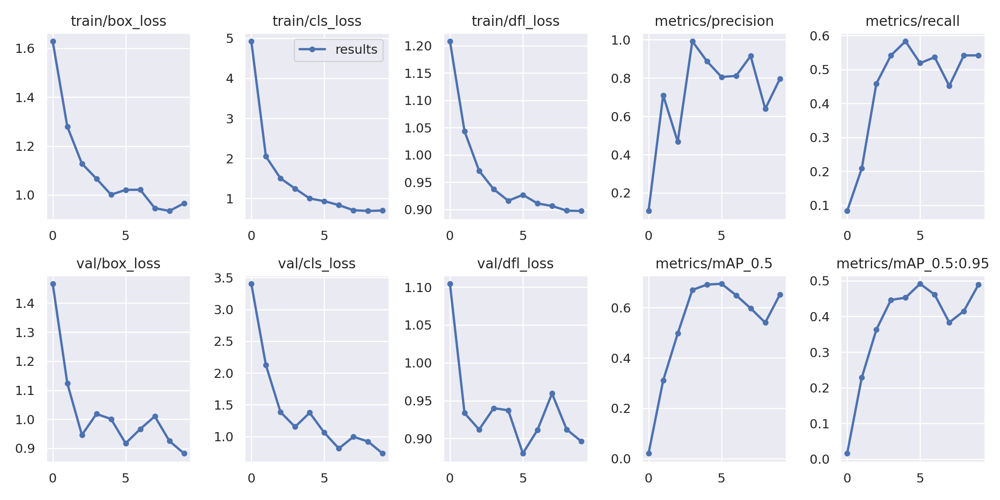

In [20]:
from IPython.display import Image

Image(filename=f"{HOME}/runs/train/exp2/results.png", width=600)

In [21]:
!python detect.py \
--img 1280 --conf 0.6 --device 0 \
--weights {HOME}/runs/train/exp2/weights/best.pt \
--source {dataset.location}/test/images

detect: weights=['/content/yolov9/runs/train/exp2/weights/best.pt'], source=/content/yolov9/Aerial-Solar-Panels-13/test/images, data=data/coco128.yaml, imgsz=[1280, 1280], conf_thres=0.6, iou_thres=0.45, max_det=1000, device=0, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 1e33dbb Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
gelan-c summary: 467 layers, 25411731 parameters, 0 gradients, 102.5 GFLOPs
image 1/6 /content/yolov9/Aerial-Solar-Panels-13/test/images/DJI_0753_MP4-28_jpg.rf.33506bc0ca65dd9508a746ae3e514942.jpg: 736x1280 1 solar-panels, 100.5ms
image 2/6 /content/yolov9/Aerial-Solar-Panels-13/test/images/DJI_0753_MP4-31_jpg.rf.1fdf00c8131fd21a13ef111b7e7502dd.jpg: 736x1280 (no detections),

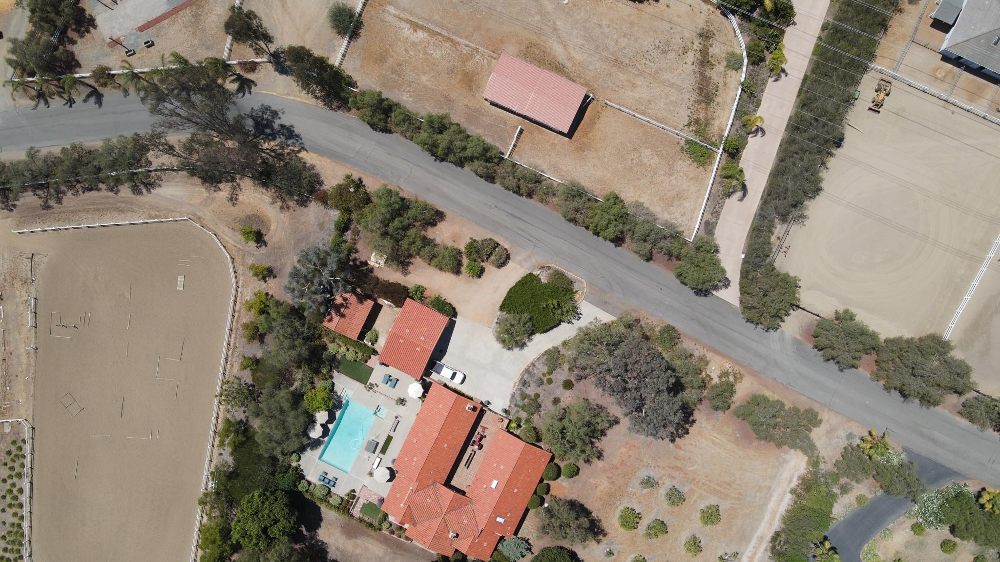

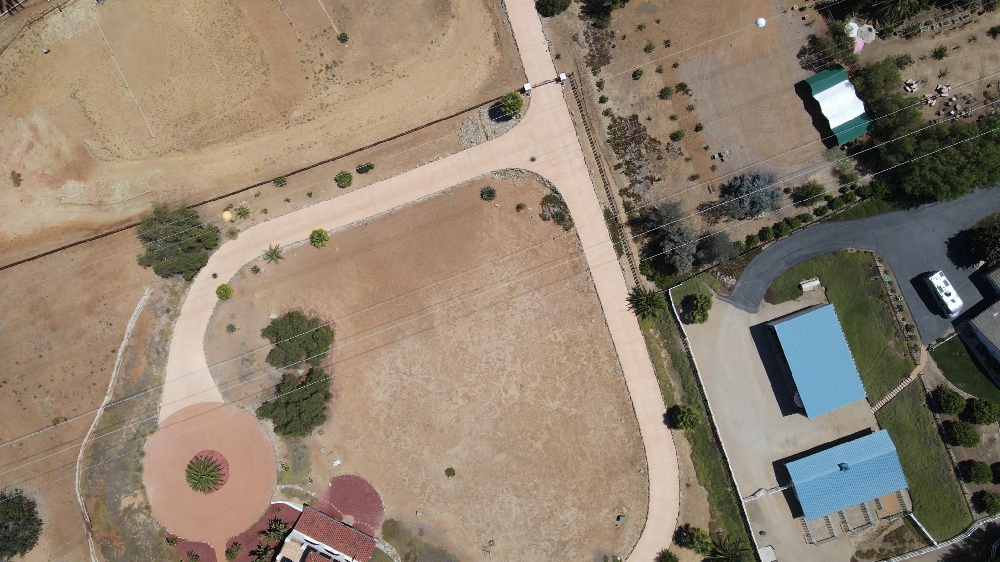

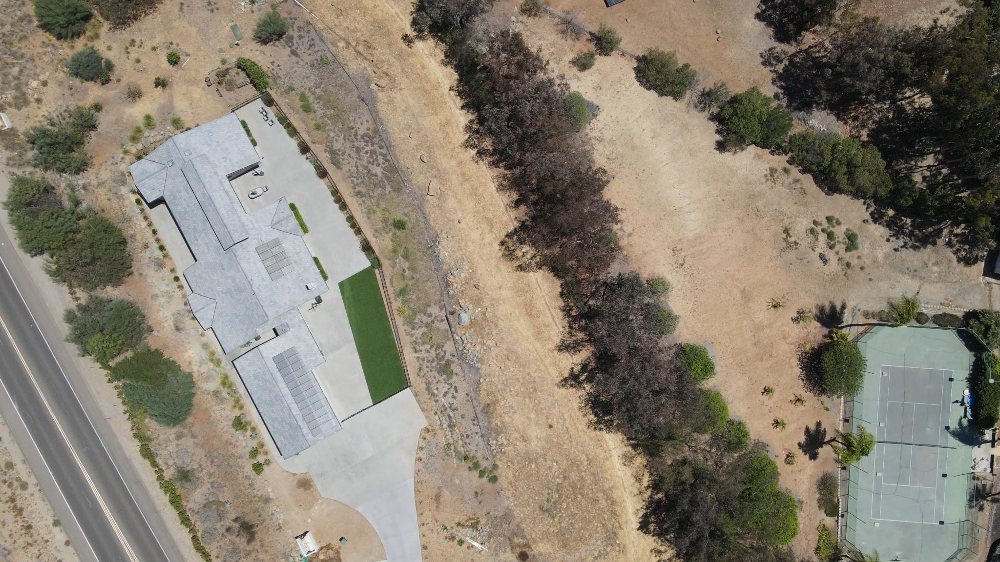

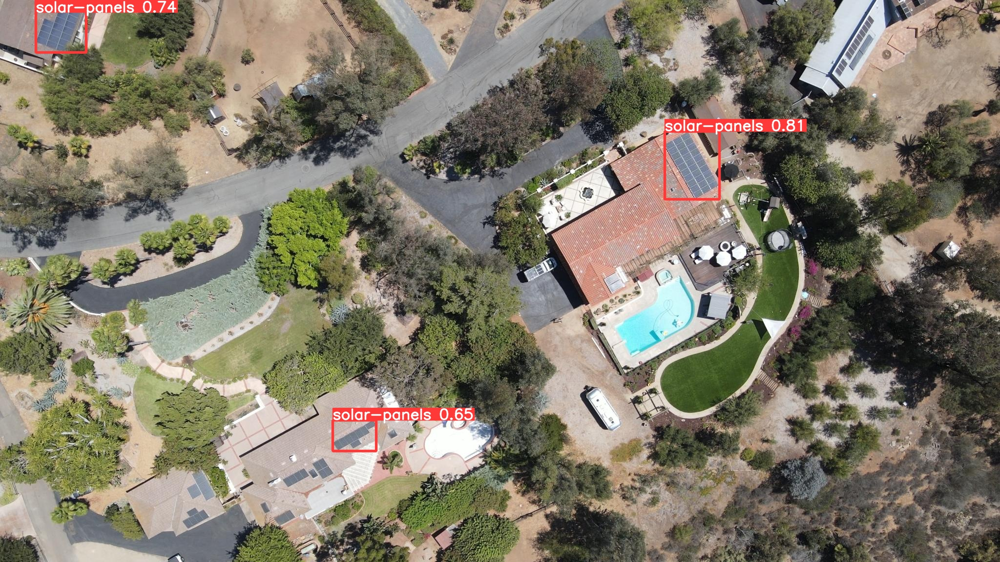

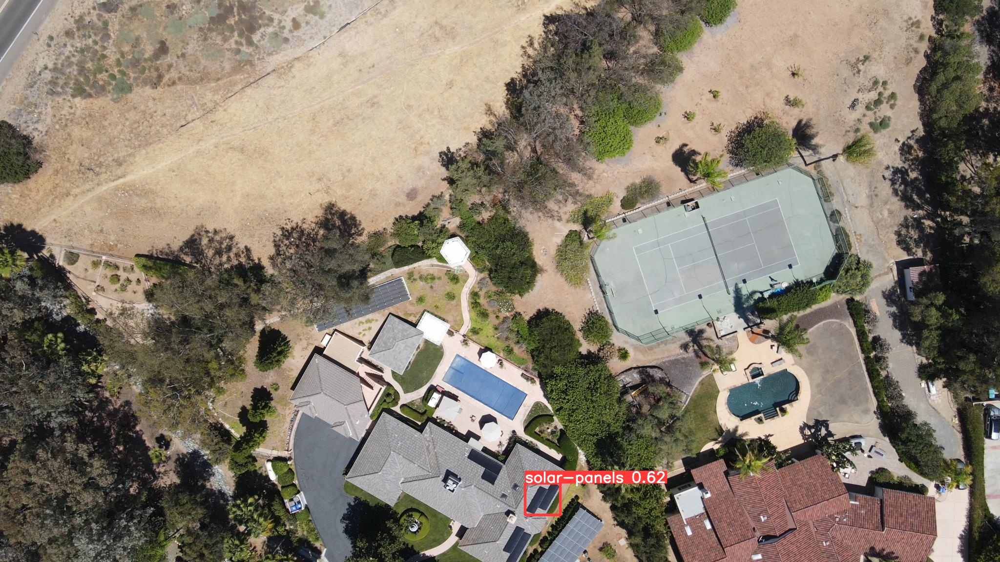

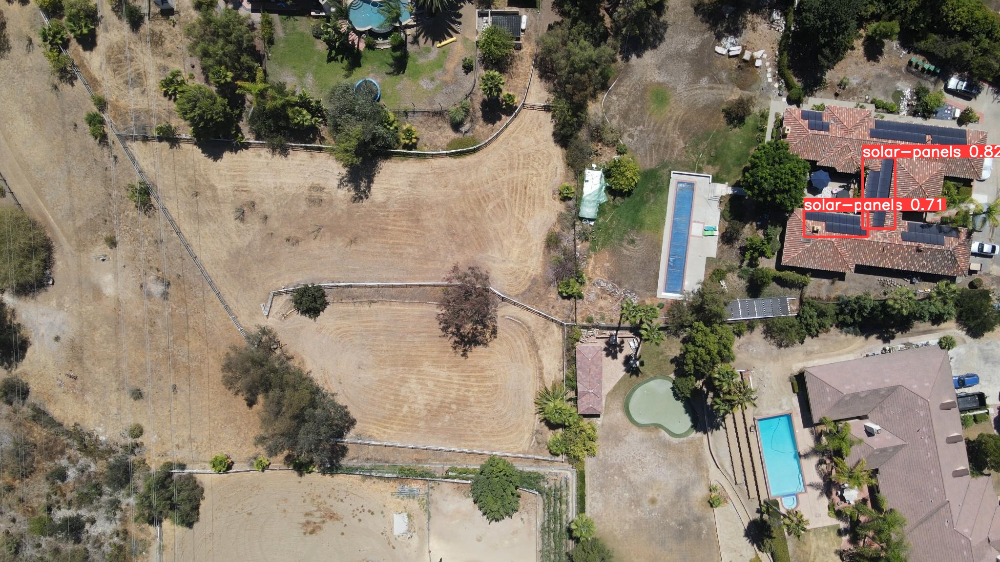

In [25]:
import glob

from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/exp/*.jpg')[:]:
      display(Image(filename=image_path, width=600))

detect: weights=['/content/yolov9/runs/train/exp2/weights/best.pt'], source=/content/yolov9/Aerial-Solar-Panels-13/test/images, data=data/coco128.yaml, imgsz=[1280, 1280], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=0, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 1e33dbb Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
gelan-c summary: 467 layers, 25411731 parameters, 0 gradients, 102.5 GFLOPs
image 1/6 /content/yolov9/Aerial-Solar-Panels-13/test/images/DJI_0753_MP4-28_jpg.rf.33506bc0ca65dd9508a746ae3e514942.jpg: 736x1280 2 solar-panelss, 93.8ms
image 2/6 /content/yolov9/Aerial-Solar-Panels-13/test/images/DJI_0753_MP4-31_jpg.rf.1fdf00c8131fd21a13ef111b7e7502dd.jpg: 736x1280 (no detections),

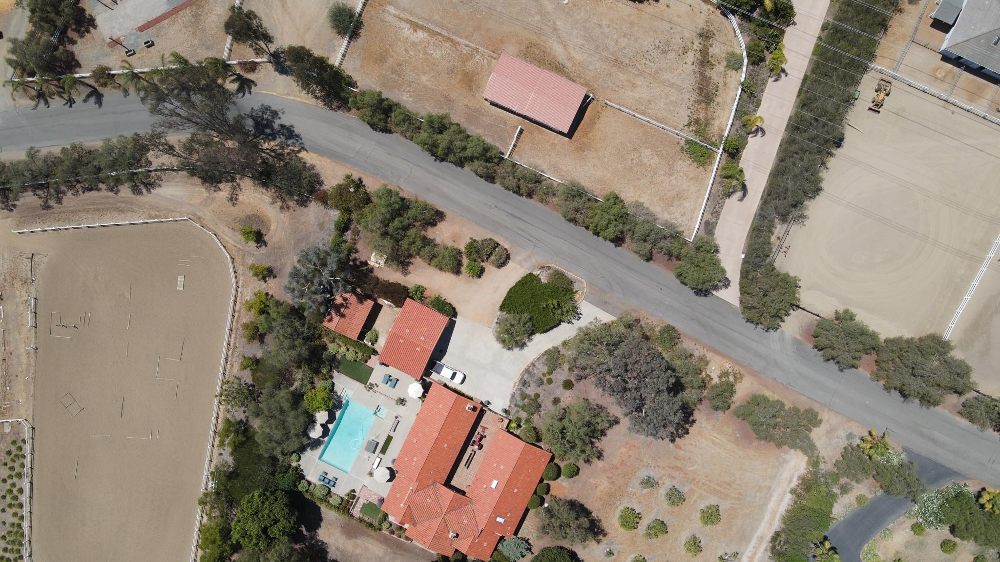

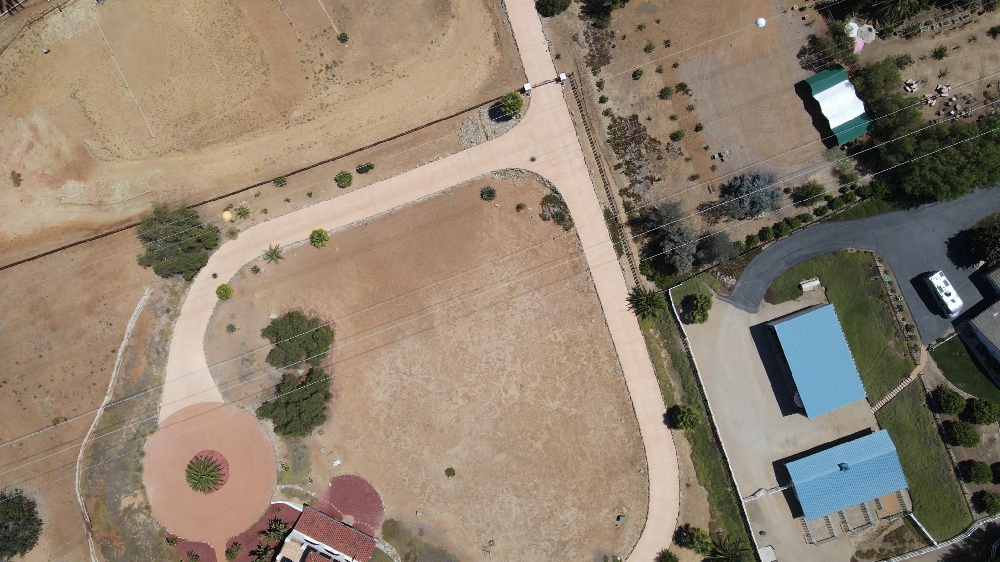

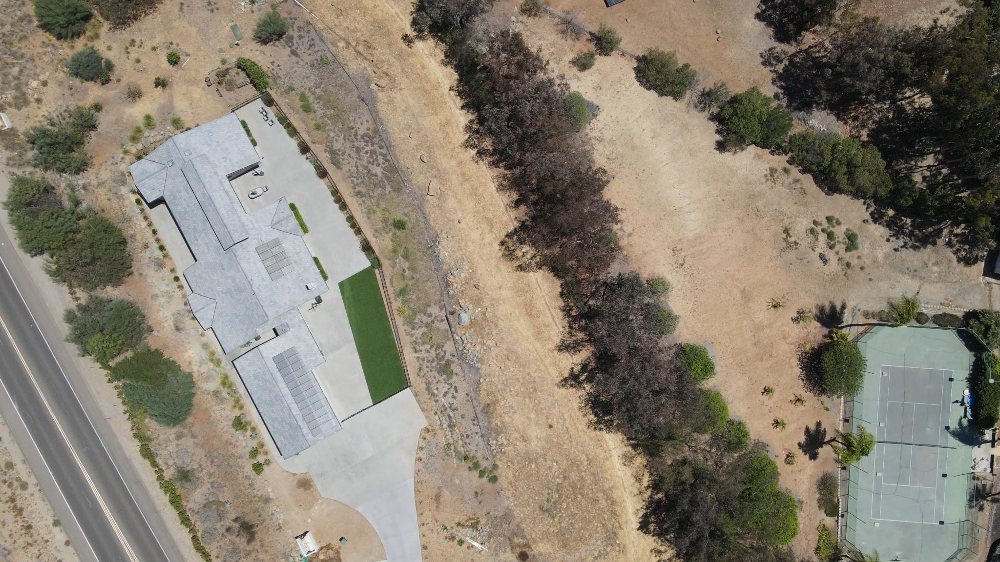

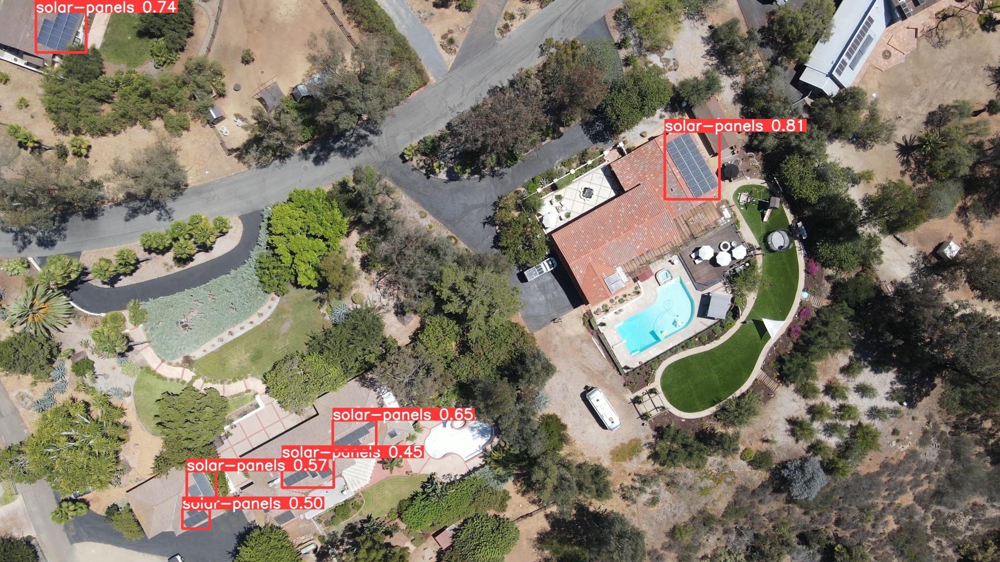

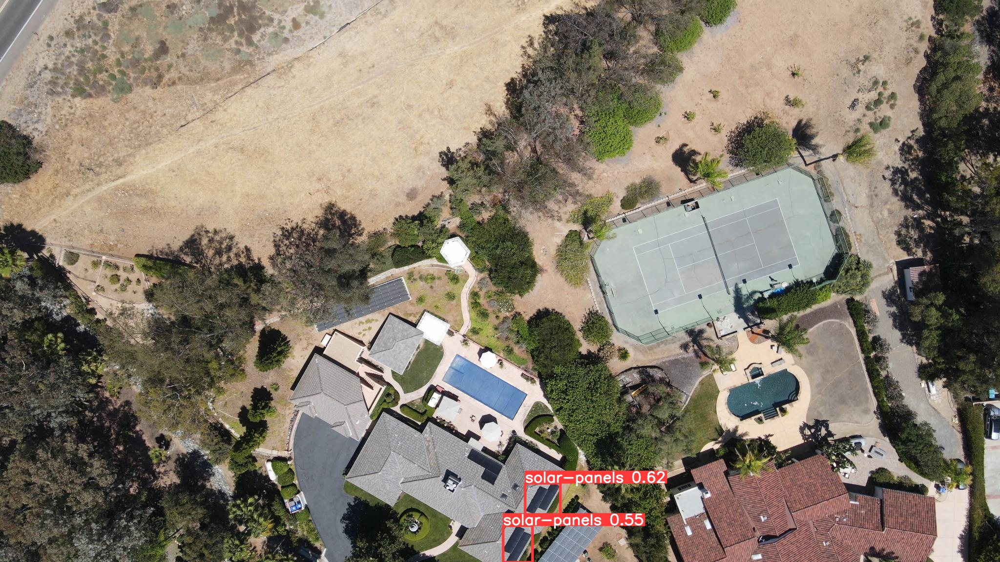

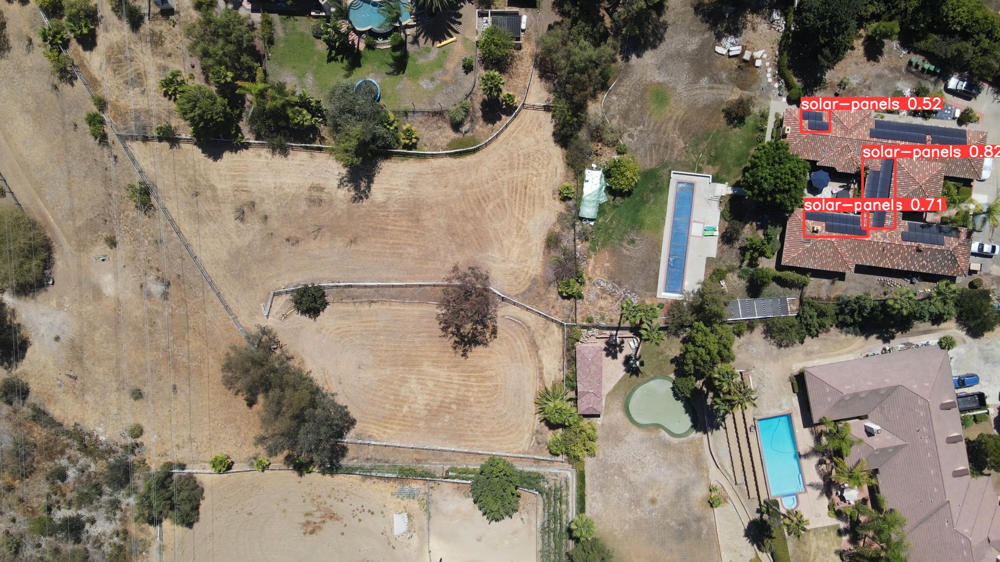

In [26]:
!python detect.py \
--img 1280 --conf 0.2 --device 0 \
--weights {HOME}/runs/train/exp2/weights/best.pt \
--source {dataset.location}/test/images


for image_path in glob.glob(f'{HOME}/runs/detect/exp2/*.jpg')[:]:
      display(Image(filename=image_path, width=600))